## Necessary Libraries

In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import json
import os
from tqdm import tqdm, tqdm_notebook
import random

import tensorflow as tf
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import *
from tensorflow.keras.optimizers import * 
from tensorflow.keras.applications import *
from tensorflow.keras.callbacks import *
from tensorflow.keras.initializers import *
from tensorflow.keras.preprocessing.image import ImageDataGenerator

os.chdir("")



import seaborn as sns
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings("ignore")

# from numpy.random import seed
# np.seed(1) #Seed function is used to save the state of random function
# from tensorflow import set_random_seed
# np.set_random_seed(1)

## Read List of artists and paintins from csv

In [6]:
artists = pd.read_csv('artists.csv')
artists.shape

(50, 8)

In [7]:
artists.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50 entries, 0 to 49
Data columns (total 8 columns):
id             50 non-null int64
name           50 non-null object
years          50 non-null object
genre          50 non-null object
nationality    50 non-null object
bio            50 non-null object
wikipedia      50 non-null object
paintings      50 non-null int64
dtypes: int64(2), object(6)
memory usage: 3.2+ KB


###  Drop Less informative columns

In [8]:
artists.drop(["id","bio","wikipedia"],axis=1,inplace=True)
artists.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50 entries, 0 to 49
Data columns (total 5 columns):
name           50 non-null object
years          50 non-null object
genre          50 non-null object
nationality    50 non-null object
paintings      50 non-null int64
dtypes: int64(1), object(4)
memory usage: 2.1+ KB


In [9]:
#https://en.wikipedia.org/wiki/Digital_image_processing
#Adding some more col as part of data preprocessing
# Sort artists by number of paintings
# above code shows "painting" feature so as to group paintings to respecting painting.
artists = artists.sort_values(by=['paintings'], ascending=False)
# Create a dataframe with artists having more than 20 paintings
artists_top = artists[artists['paintings'] >= 20].reset_index()
artists_top = artists_top[['name', 'paintings']]

artists_top['class_weight'] = artists_top.paintings.sum() / (artists_top.shape[0] * artists_top.paintings)
artists_top

,name,paintings,class_weight
0,Vincent van Gogh,877,0.192611
1,Edgar Degas,702,0.240627
2,Pablo Picasso,439,0.384784
3,Pierre-Auguste Renoir,336,0.502738
4,Albrecht Dürer,328,0.515000
5,Paul Gauguin,311,0.543151
6,Francisco Goya,291,0.580481
7,Rembrandt,262,0.644733
8,Alfred Sisley,259,0.652201
9,Titian,255,0.662431


In [10]:
artists_top['class_weight'] = artists_top.paintings.sum() / (artists_top.shape[0] * artists_top.paintings)

In [11]:
artists_year = pd.DataFrame(artists.years.str.split(' ',2).tolist(),columns = ['birth','-','death'])
artists_year.drop(["-"],axis=1,inplace=True)
artists["birth"]=artists_year.birth
artists["death"]=artists_year.death
artists.drop(["years"],axis=1,inplace=True)

In [12]:
artists.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 50 entries, 8 to 49
Data columns (total 6 columns):
name           50 non-null object
genre          50 non-null object
nationality    50 non-null object
paintings      50 non-null int64
birth          50 non-null object
death          50 non-null object
dtypes: int64(1), object(5)
memory usage: 2.7+ KB


In [13]:
artists["birth"]=artists["birth"].apply(lambda x: int(x))
artists["death"]=artists["death"].apply(lambda x: int(x))
artists["age"]=artists.death-artists.birth
artists.age.describe()

count    50.00000
mean     64.78000
std      16.74087
min      32.00000
25%      55.25000
50%      65.50000
75%      77.50000
max      98.00000
Name: age, dtype: float64

In [14]:
artists['age']=artists['age']
bins=[30,55,65,77,98]
labels=["young adult","early adult","adult","senior"]
artists['age_group']=pd.cut(artists['age'],bins,labels=labels)
artists.tail()

,name,genre,nationality,paintings,birth,death,age,age_group
48,Michelangelo,High Renaissance,Italian,49,1798,1863,65,early adult
38,Paul Cezanne,Post-Impressionism,French,47,1840,1926,86,senior
41,Georges Seurat,Post-Impressionism,French,43,1863,1944,81,senior
39,Eugene Delacroix,Romanticism,French,31,1886,1957,71,adult
49,Jackson Pollock,Abstract Expressionism,American,24,1912,1956,44,young adult


In [15]:
artists = artists.sort_values(by=["age"], ascending=False)
artists['rank']=tuple(zip(artists.age))
artists['rank']=artists.groupby('age',sort=False)['rank'].apply(lambda x : pd.Series(pd.factorize(x)[0])).values
artists.drop(["rank"],axis=1,inplace=True)
artists.reset_index(inplace=True,drop=True)
artists.head()

,name,genre,nationality,paintings,birth,death,age,age_group
0,Hieronymus Bosch,Northern Renaissance,Dutch,137,1887,1985,98,senior
1,Diego Rivera,"Social Realism,Muralism",Mexican,70,1881,1973,92,senior
2,Jan van Eyck,Northern Renaissance,Flemish,81,1893,1983,90,senior
3,Andy Warhol,Pop Art,American,181,1475,1564,89,senior
4,Gustav Klimt,"Symbolism,Art Nouveau",Austrian,117,1488,1576,88,senior


No handles with labels found to put in legend.


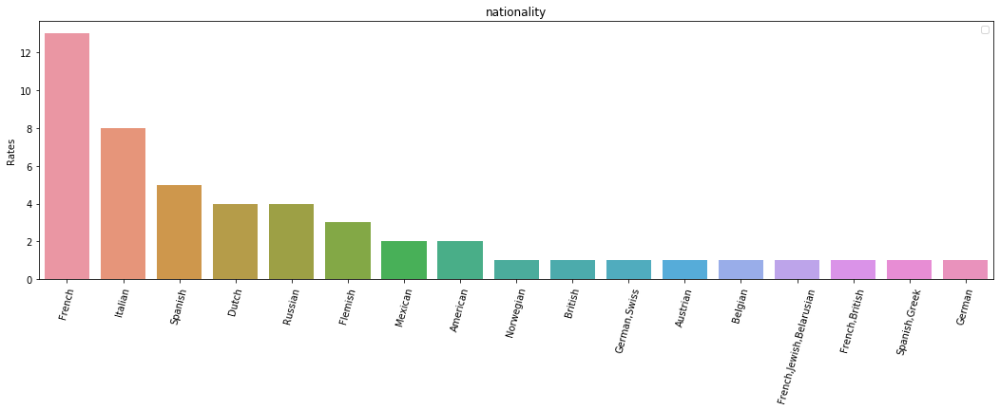

In [16]:
plt.figure(figsize=(18,5))

sns.barplot(x=artists['nationality'].value_counts().index,y=artists['nationality'].value_counts().values)
plt.title('nationality')
plt.xticks(rotation=75)
plt.ylabel('Rates')
plt.legend(loc=0)
plt.show()

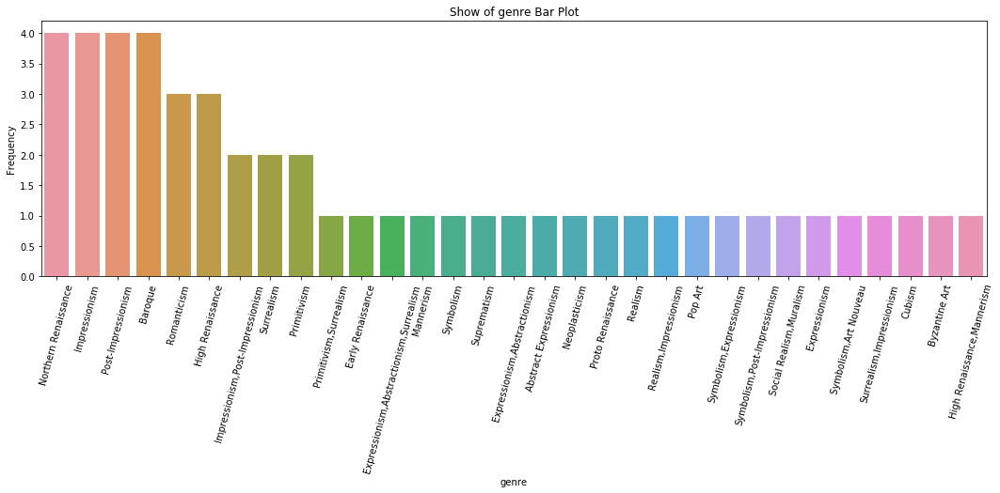

In [17]:
plt.figure(figsize=(18,5))
sns.barplot(x=artists['genre'].value_counts().index,
              y=artists['genre'].value_counts().values)
plt.xlabel('genre')
plt.xticks(rotation=75)
plt.ylabel('Frequency')
plt.title('Show of genre Bar Plot')
plt.show()

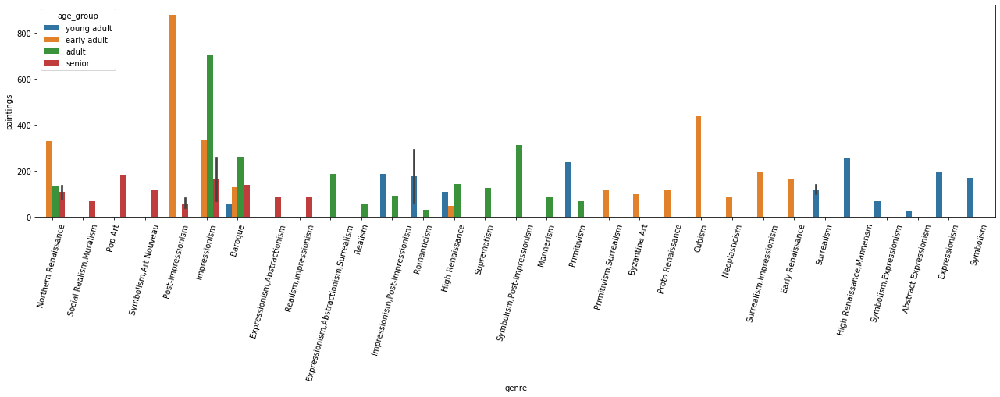

In [18]:
plt.figure(figsize=(22,5))
sns.barplot(x = "genre", y = "paintings", hue = "age_group", data = artists)
plt.xticks(rotation=75)
plt.show()

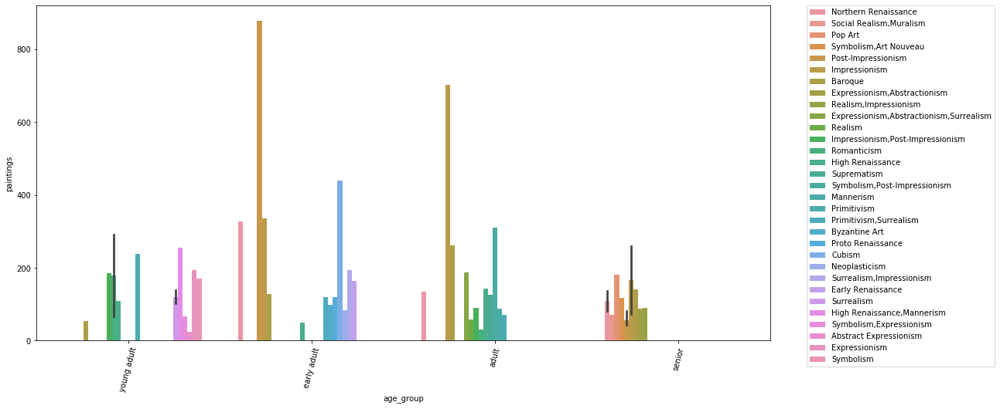

In [19]:
plt.figure(figsize=(17,8))
sns.barplot(x = "age_group", y = "paintings", hue = "genre", data = artists)
plt.xticks(rotation=75)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
plt.show()

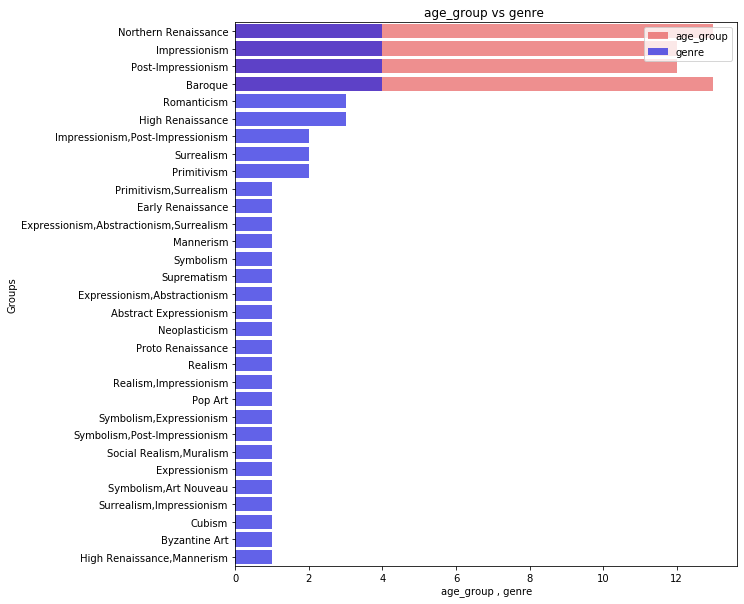

In [20]:
f,ax=plt.subplots(figsize=(9,10))
sns.barplot(x=artists['age_group'].value_counts().values,y=artists['age_group'].value_counts().index,alpha=0.5,color='red',label='age_group')
sns.barplot(x=artists['genre'].value_counts().values,y=artists['genre'].value_counts().index,color='blue',alpha=0.7,label='genre')
ax.legend(loc='upper right',frameon=True)
ax.set(xlabel='age_group , genre',ylabel='Groups',title="age_group vs genre ")
plt.show()

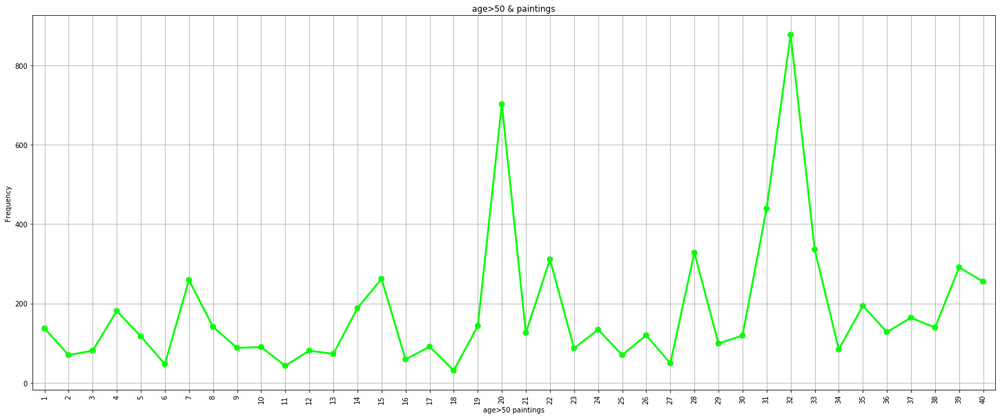

In [21]:
artists['age'].unique()
len(artists[(artists['age']>50)].paintings)
f,ax1=plt.subplots(figsize=(25,10))
sns.pointplot(x=np.arange(1,41),y=artists[(artists['age']>50)].paintings,color='lime',alpha=0.8)

plt.xlabel('age>50 paintings')
plt.ylabel('Frequency')
plt.title('age>50 & paintings')
plt.xticks(rotation=90)
plt.grid()
plt.show()

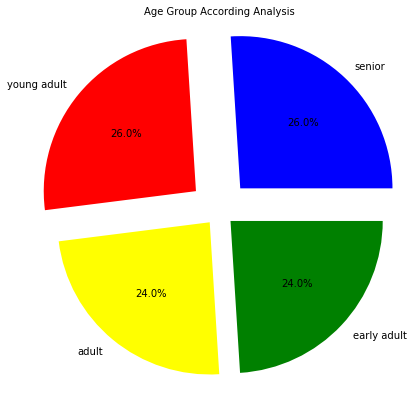

In [22]:
labels=artists['age_group'].value_counts().index
colors=['blue','red','yellow','green']
explode=[0.2,0.2,0.1,0.1,]
values=artists['age_group'].value_counts().values

#visualization
plt.figure(figsize=(7,7))
plt.pie(values,explode=explode,labels=labels,colors=colors,autopct='%1.1f%%')
plt.title('Age Group According Analysis',color='black',fontsize=10)
plt.show()

<Figure size 1080x504 with 0 Axes>

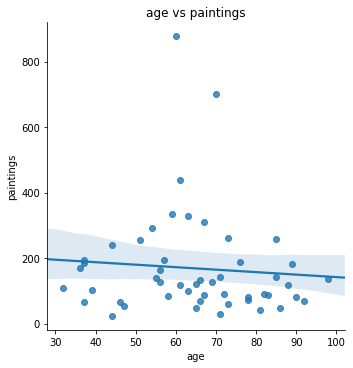

In [23]:
plt.figure(figsize=(15,7))
sns.lmplot(x='age',y='paintings',data=artists)
plt.xlabel('age')
plt.ylabel('paintings')
plt.title('age vs paintings')
plt.show()

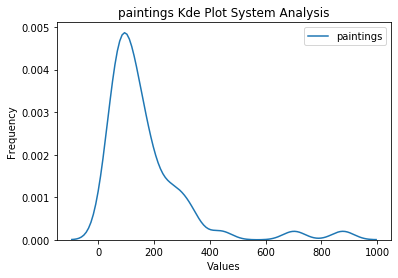

In [24]:
sns.kdeplot(artists['paintings'])
plt.xlabel('Values')
plt.ylabel('Frequency')
plt.title('paintings Kde Plot System Analysis')
plt.show()

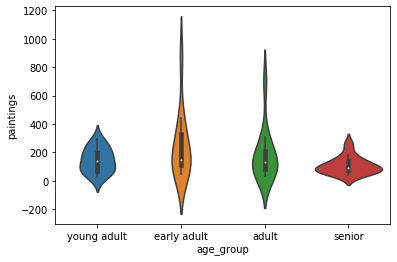

In [25]:
sns.violinplot(x=artists['age_group'],y=artists['paintings'])
plt.show()

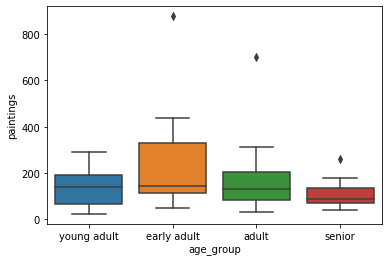

In [26]:
sns.boxplot(x=artists['age_group'],y=artists['paintings'])
plt.show()

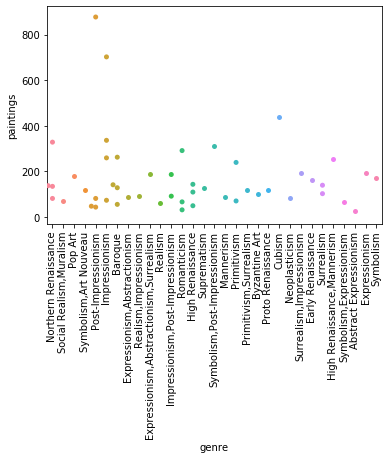

In [27]:
sns.swarmplot(x=artists['genre'],y=artists['paintings'])
plt.xticks(rotation=90)
plt.show()

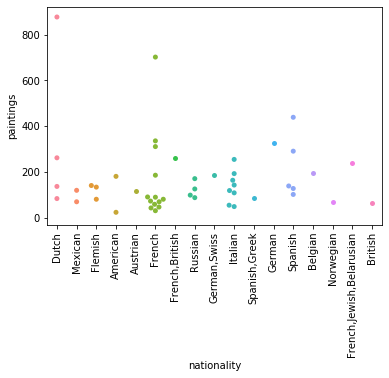

In [28]:
sns.swarmplot(x=artists['nationality'],y=artists['paintings'])
plt.xticks(rotation=90)
plt.show()

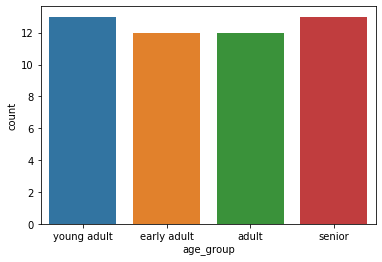

In [29]:
sns.countplot(artists['age_group'])
plt.show()

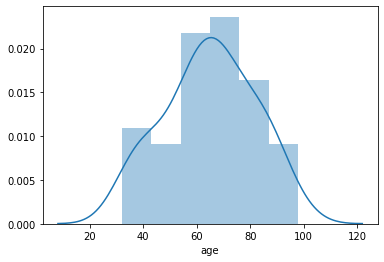

In [30]:
ax = sns.distplot(artists['age'])
plt.show()

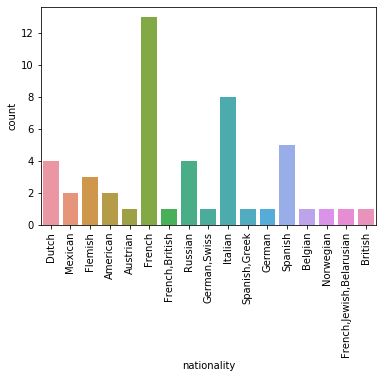

In [31]:
sns.countplot(artists['nationality'])
plt.xticks(rotation=90)
plt.show()

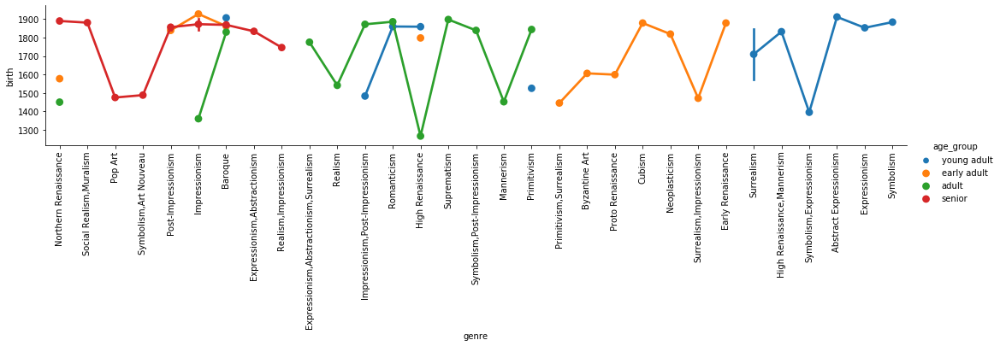

In [32]:
sns.factorplot(x="genre", y="birth", hue="age_group", data=artists,size=3, aspect=5)
#plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
plt.xticks(rotation=90)
plt.show()


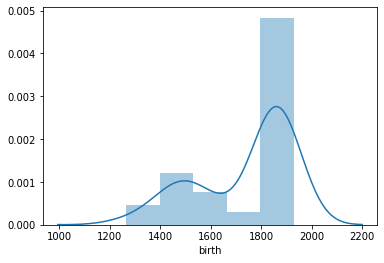

In [33]:
ax = sns.distplot(artists['birth'])
plt.show()

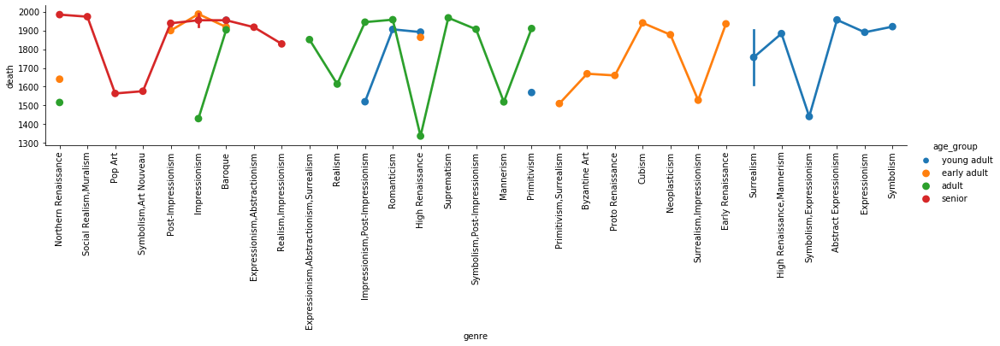

In [34]:
sns.factorplot(x="genre", y="death", hue="age_group", data=artists,size=3, aspect=5)
#plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
plt.xticks(rotation=90)
plt.show()

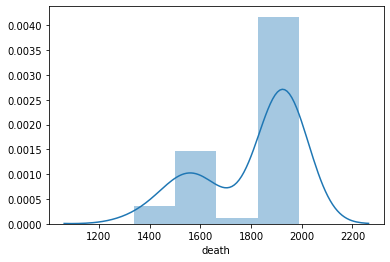

In [35]:
ax = sns.distplot(artists['death'])
plt.show()

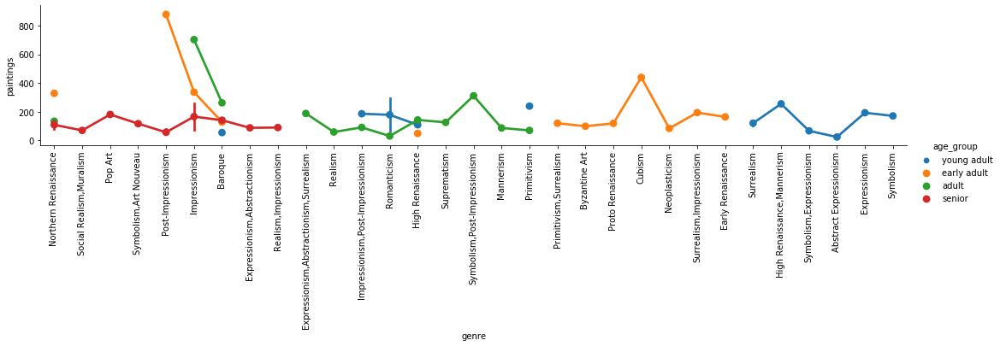

In [36]:
sns.factorplot(x="genre", y="paintings", hue="age_group", data=artists,size=3, aspect=5)
#plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
plt.xticks(rotation=90)
plt.show()

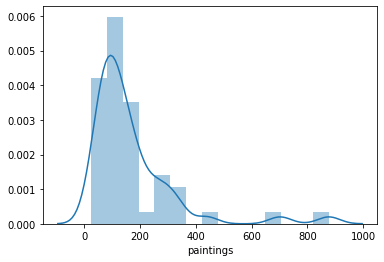

In [37]:
ax = sns.distplot(artists['paintings'])
plt.show()

In [38]:
# Explore images of top artists
images_dir = 'D:/DS5500/P2/Data/images/images'  #my files with this directory and folder you can change as u want to.
artists_dirs = os.listdir(images_dir)
artists_top_name = artists_top['name'].str.replace(' ', '_').values

# See if all directories exist
for name in artists_top_name:
    if os.path.exists(os.path.join(images_dir, name)):
        print("Found -->", os.path.join(images_dir, name))
    else:
        print("Did not find -->", os.path.join(images_dir, name))

Found --> D:/DS5500/P2/Data/images/images\Vincent_van_Gogh
Found --> D:/DS5500/P2/Data/images/images\Edgar_Degas
Found --> D:/DS5500/P2/Data/images/images\Pablo_Picasso
Found --> D:/DS5500/P2/Data/images/images\Pierre-Auguste_Renoir
Found --> D:/DS5500/P2/Data/images/images\Albrecht_Dürer
Found --> D:/DS5500/P2/Data/images/images\Paul_Gauguin
Found --> D:/DS5500/P2/Data/images/images\Francisco_Goya
Found --> D:/DS5500/P2/Data/images/images\Rembrandt
Found --> D:/DS5500/P2/Data/images/images\Alfred_Sisley
Found --> D:/DS5500/P2/Data/images/images\Titian
Found --> D:/DS5500/P2/Data/images/images\Marc_Chagall
Found --> D:/DS5500/P2/Data/images/images\Rene_Magritte
Found --> D:/DS5500/P2/Data/images/images\Amedeo_Modigliani
Found --> D:/DS5500/P2/Data/images/images\Paul_Klee
Found --> D:/DS5500/P2/Data/images/images\Henri_Matisse
Found --> D:/DS5500/P2/Data/images/images\Andy_Warhol
Found --> D:/DS5500/P2/Data/images/images\Mikhail_Vrubel
Found --> D:/DS5500/P2/Data/images/images\Sandro_Bo

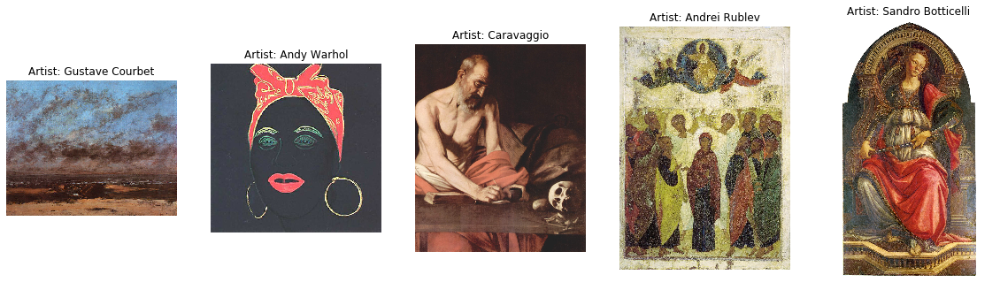

In [39]:
#https://www.analyticsvidhya.com/blog/2019/08/3-techniques-extract-features-from-image-data-machine-learning-python/
# Print few random paintings
n = 5  # taking 5 random pic
fig, axes = plt.subplots(1, n, figsize=(20,10))

for i in range(n):
    random_artist = random.choice(artists_top_name)
    random_image = random.choice(os.listdir(os.path.join(images_dir, random_artist)))
    random_image_file = os.path.join(images_dir, random_artist, random_image)
    image = plt.imread(random_image_file)
    axes[i].imshow(image)
    axes[i].set_title("Artist: " + random_artist.replace('_', ' '))
    axes[i].axis('off')

plt.show()

In [40]:
#https://www.kaggle.com/supratimhaldar/
# Augment data
batch_size = 16
train_input_shape = (224, 224, 3)
n_classes = artists_top.shape[0]

train_datagen = ImageDataGenerator(validation_split=0.2,
                                   rescale=1./255.,
                                   #rotation_range=45,
                                   #width_shift_range=0.5,
                                   #height_shift_range=0.5,
                                   shear_range=5,
                                   #zoom_range=0.7,
                                   horizontal_flip=True,
                                   vertical_flip=True,
                                  )

train_generator = train_datagen.flow_from_directory(directory=images_dir,
                                                    class_mode='categorical',
                                                    target_size=train_input_shape[0:2],
                                                    batch_size=batch_size,
                                                    subset="training",
shuffle=True,
                                                    classes=artists_top_name.tolist()
                                                   )

valid_generator = train_datagen.flow_from_directory(directory=images_dir,
                                                    class_mode='categorical',
                                                    target_size=train_input_shape[0:2],
                                                    batch_size=batch_size,
                                                    subset="validation",
shuffle=True,
                                                    classes=artists_top_name.tolist()
                                                   )

STEP_SIZE_TRAIN = train_generator.n//train_generator.batch_size
STEP_SIZE_VALID = valid_generator.n//valid_generator.batch_size
print("Total number of batches =", STEP_SIZE_TRAIN, "and", STEP_SIZE_VALID)

Found 6779 images belonging to 50 classes.
Found 1667 images belonging to 50 classes.
Total number of batches = 423 and 104


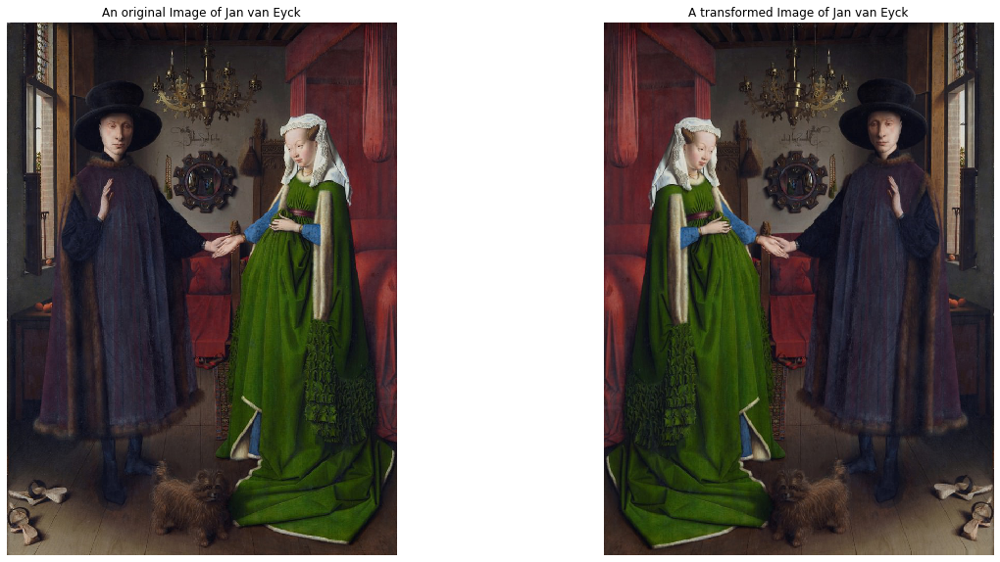

In [41]:
#https://www.kaggle.com/supratimhaldar/
# Print a random paintings and it's random augmented version
fig, axes = plt.subplots(1, 2, figsize=(20,10))

random_artist = random.choice(artists_top_name)
random_image = random.choice(os.listdir(os.path.join(images_dir, random_artist)))
random_image_file = os.path.join(images_dir, random_artist, random_image)

# Original image
image = plt.imread(random_image_file)
axes[0].imshow(image)
axes[0].set_title("An original Image of " + random_artist.replace('_', ' '))
axes[0].axis('off')

# Transformed image
aug_image = train_datagen.random_transform(image)
axes[1].imshow(aug_image)
axes[1].set_title("A transformed Image of " + random_artist.replace('_', ' '))
axes[1].axis('off')

plt.show()

## Evaluation Functions

In [42]:
# Plot the training graph
def plot_training(model_history):
    acc = model_history.history['accuracy']
    val_acc = model_history.history['val_accuracy']
    loss = model_history.history['loss']
    val_loss = model_history.history['val_loss']
    epochs = range(len(acc))

    fig, axes = plt.subplots(1, 2, figsize=(15,5))
    
    axes[0].plot(epochs, acc, 'r-', label='Training Accuracy')
    axes[0].plot(epochs, val_acc, 'b--', label='Validation Accuracy')
    axes[0].set_title('Training and Validation Accuracy')
    axes[0].legend(loc='best')

    axes[1].plot(epochs, loss, 'r-', label='Training Loss')
    axes[1].plot(epochs, val_loss, 'b--', label='Validation Loss')
    axes[1].set_title('Training and Validation Loss')
    axes[1].legend(loc='best')
    
    plt.show()
    


In [43]:
# Classification report and confusion matrix
from sklearn.metrics import *
import seaborn as sns

tick_labels = artists_top_name.tolist()

def showClassficationReport_Generator(model, valid_generator, STEP_SIZE_VALID):
    # Loop on each generator batch and predict
    y_pred, y_true = [], []
    for i in range(STEP_SIZE_VALID):
        (X,y) = next(valid_generator)
        y_pred.append(model.predict(X))
        y_true.append(y)
    
    # Create a flat list for y_true and y_pred
    y_pred = [subresult for result in y_pred for subresult in result]
    y_true = [subresult for result in y_true for subresult in result]
    
    # Update Truth vector based on argmax
    y_true = np.argmax(y_true, axis=1)
    y_true = np.asarray(y_true).ravel()
    
    # Update Prediction vector based on argmax
    y_pred = np.argmax(y_pred, axis=1)
    y_pred = np.asarray(y_pred).ravel()
    
    # Confusion Matrix
    fig, ax = plt.subplots(figsize=(10,10))
    conf_matrix = confusion_matrix(y_true, y_pred, labels=np.arange(n_classes))
    conf_matrix = conf_matrix/np.sum(conf_matrix, axis=1)
    sns.heatmap(conf_matrix, annot=True, fmt=".2f", square=True, cbar=False, 
cmap=plt.cm.jet, xticklabels=tick_labels, yticklabels=tick_labels,ax=ax)
    ax.set_ylabel('Actual')
    ax.set_xlabel('Predicted')
    ax.set_title('Confusion Matrix')
    plt.show()
    
    print('Classification Report:')
    print(classification_report(y_true, y_pred, labels=np.arange(n_classes), target_names=artists_top_name.tolist()))



In [44]:
from keras.preprocessing import *

def Prediction(model):


    n = 5
    fig, axes = plt.subplots(1, n, figsize=(25,10))

    for i in range(n):
        random_artist = random.choice(artists_top_name)
        random_image = random.choice(os.listdir(os.path.join(images_dir, random_artist)))
        random_image_file = os.path.join(images_dir, random_artist, random_image)

    # Original image

        test_image = image.load_img(random_image_file, target_size=(train_input_shape[0:2]))

    # Predict artist
        test_image = image.img_to_array(test_image)
        test_image /= 255.
        test_image = np.expand_dims(test_image, axis=0)

        prediction = model.predict(test_image)
        prediction_probability = np.amax(prediction)
        prediction_idx = np.argmax(prediction)

        labels = train_generator.class_indices
        labels = dict((v,k) for k,v in labels.items())

    #print("Actual artist =", random_artist.replace('_', ' '))
    #print("Predicted artist =", labels[prediction_idx].replace('_', ' '))
    #print("Prediction probability =", prediction_probability*100, "%")

        title = "Actual artist = {}\nPredicted artist = {}\nPrediction probability = {:.2f} %" \
                    .format(random_artist.replace('_', ' '), labels[prediction_idx].replace('_', ' '),
                            prediction_probability*100)

    # Print image
        axes[i].imshow(plt.imread(random_image_file))
        axes[i].set_title(title)
        axes[i].axis('off')

    plt.show()

## Two layerd CNN

In [41]:
def twolayer_CNN(input_shape):
    model = Sequential()
    model.add(Conv2D(input_shape = train_input_shape, filters = 32 , kernel_size = (3,3) ,padding='same', name= "conv_1"))    
    model.add(Conv2D(filters = 64 ,  kernel_size = (3,3), padding='same', name= "conv_12"))
    model.add(Activation('relu'))
    model.add(Flatten(input_shape=train_input_shape))
    #model.add(MaxPooling2D((4,4) , name = "max_pool_1"))
    model.add(Dense(n_classes, activation = 'softmax'))
    return model

In [42]:
twolayer_model = twolayer_CNN((train_input_shape))


sgd = SGD(lr=0.003, momentum=0.9, nesterov=True)

twolayer_model.compile(loss= 'categorical_crossentropy' ,
              optimizer = sgd,
               metrics=['accuracy'] )

twolayer_model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv_1 (Conv2D)              (None, 224, 224, 32)      896       
_________________________________________________________________
conv_12 (Conv2D)             (None, 224, 224, 64)      18496     
_________________________________________________________________
activation (Activation)      (None, 224, 224, 64)      0         
_________________________________________________________________
flatten (Flatten)            (None, 3211264)           0         
_________________________________________________________________
dense (Dense)                (None, 50)                160563250 
Total params: 160,582,642
Trainable params: 160,582,642
Non-trainable params: 0
_________________________________________________________________


In [43]:
n_epoch = 50 #n_epoch :number of times training vect to update weight/ one complete iteration. 


early_stop = EarlyStopping(monitor='val_loss', patience=20, verbose=1, 
                           mode='auto', restore_best_weights=True)

reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=5, #I used ReduceLROnPlateau callback function when matri
                              verbose=1, mode='auto')
# Train the model - all layers
two_layer_history = twolayer_model.fit_generator(generator=train_generator, steps_per_epoch=STEP_SIZE_TRAIN,
                              validation_data=valid_generator, validation_steps=STEP_SIZE_VALID,
                              epochs=n_epoch,
                              shuffle=True,
                              verbose=1                           
                             )

Instructions for updating:
Please use Model.fit, which supports generators.
Epoch 1/50
175/423 [===========>..................] - ETA: 3s - loss: 3.9212 - accuracy: 0.12 - ETA: 6:15 - loss: 17.2536 - accuracy: 0.218 - ETA: 8:16 - loss: 13.2534 - accuracy: 0.145 - ETA: 9:16 - loss: 13.4280 - accuracy: 0.109 - ETA: 9:51 - loss: 68.3870 - accuracy: 0.087 - ETA: 10:12 - loss: 123.9199 - accuracy: 0.072 - ETA: 10:27 - loss: 676.8832 - accuracy: 0.071 - ETA: 10:39 - loss: 592.7615 - accuracy: 0.062 - ETA: 10:46 - loss: 527.3359 - accuracy: 0.055 - ETA: 10:54 - loss: 475.0008 - accuracy: 0.050 - ETA: 11:01 - loss: 432.1745 - accuracy: 0.045 - ETA: 11:05 - loss: 396.4857 - accuracy: 0.046 - ETA: 11:07 - loss: 366.2878 - accuracy: 0.048 - ETA: 11:08 - loss: 340.4036 - accuracy: 0.053 - ETA: 11:09 - loss: 317.9707 - accuracy: 0.050 - ETA: 11:06 - loss: 298.3413 - accuracy: 0.054 - ETA: 11:07 - loss: 281.0218 - accuracy: 0.058 - ETA: 11:09 - loss: 265.6262 - accuracy: 0.055 - ETA: 11:09 - loss: 2

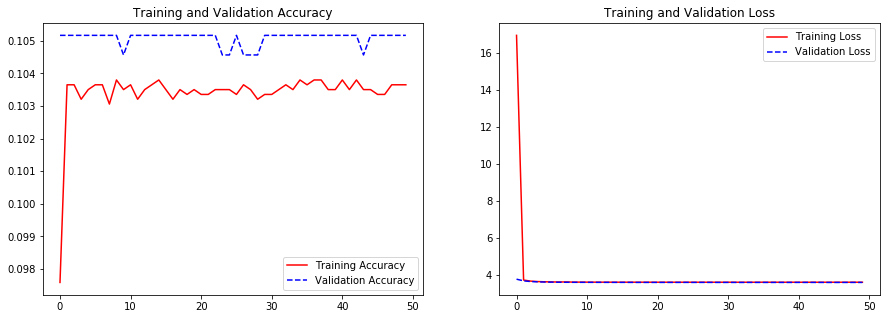

In [44]:
plot_training(two_layer_history)


In [45]:
two_layer_history.history['loss']

[16.94321060180664,
 3.7282979488372803,
 3.6704163551330566,
 3.646380662918091,
 3.6339447498321533,
 3.6266016960144043,
 3.6221978664398193,
 3.627509117126465,
 3.6167187690734863,
 3.6160707473754883,
 3.614557981491089,
 3.614016532897949,
 3.612980365753174,
 3.6130335330963135,
 3.611743211746216,
 3.611726999282837,
 3.612643003463745,
 3.611417293548584,
 3.612238883972168,
 3.6110174655914307,
 3.610996961593628,
 3.6115710735321045,
 3.6113510131835938,
 3.6111340522766113,
 3.6105263233184814,
 3.610870122909546,
 3.6111767292022705,
 3.6107330322265625,
 3.6108620166778564,
 3.6106293201446533,
 3.611124038696289,
 3.60968279838562,
 3.609983444213867,
 3.609872341156006,
 3.610382318496704,
 3.6112260818481445,
 3.6099693775177,
 3.610229730606079,
 3.6100285053253174,
 3.6110849380493164,
 3.609133243560791,
 3.6105129718780518,
 3.609637498855591,
 3.610121726989746,
 3.610506772994995,
 3.6104750633239746,
 3.610494613647461,
 3.610422134399414,
 3.6110095977783203,


In [46]:
two_layer_history.history

{'loss': [16.94321060180664,
  3.7282979488372803,
  3.6704163551330566,
  3.646380662918091,
  3.6339447498321533,
  3.6266016960144043,
  3.6221978664398193,
  3.627509117126465,
  3.6167187690734863,
  3.6160707473754883,
  3.614557981491089,
  3.614016532897949,
  3.612980365753174,
  3.6130335330963135,
  3.611743211746216,
  3.611726999282837,
  3.612643003463745,
  3.611417293548584,
  3.612238883972168,
  3.6110174655914307,
  3.610996961593628,
  3.6115710735321045,
  3.6113510131835938,
  3.6111340522766113,
  3.6105263233184814,
  3.610870122909546,
  3.6111767292022705,
  3.6107330322265625,
  3.6108620166778564,
  3.6106293201446533,
  3.611124038696289,
  3.60968279838562,
  3.609983444213867,
  3.609872341156006,
  3.610382318496704,
  3.6112260818481445,
  3.6099693775177,
  3.610229730606079,
  3.6100285053253174,
  3.6110849380493164,
  3.609133243560791,
  3.6105129718780518,
  3.609637498855591,
  3.610121726989746,
  3.610506772994995,
  3.6104750633239746,
  3.610

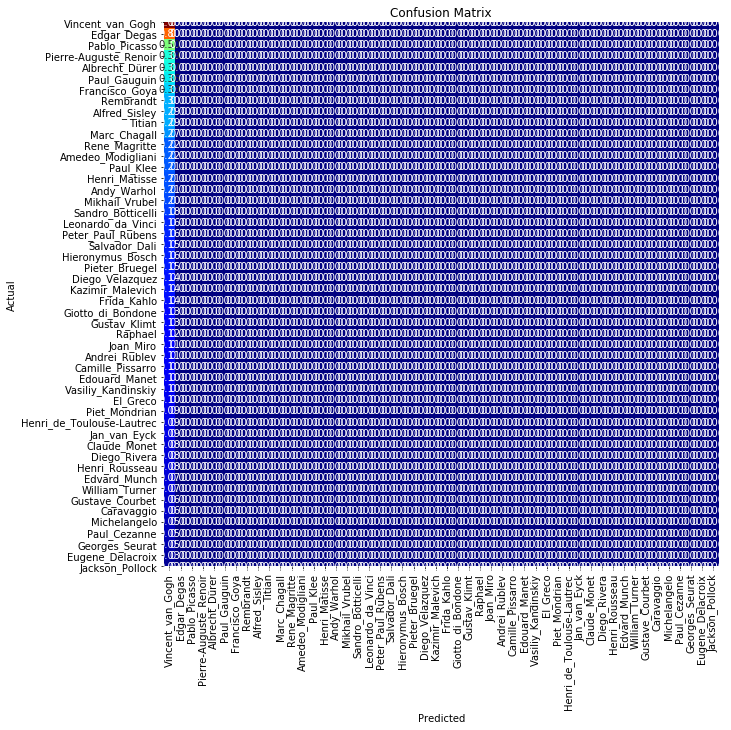

Classification Report:
                           precision    recall  f1-score   support

         Vincent_van_Gogh       0.10      1.00      0.19       174
              Edgar_Degas       0.00      0.00      0.00       140
            Pablo_Picasso       0.00      0.00      0.00        87
    Pierre-Auguste_Renoir       0.00      0.00      0.00        67
           Albrecht_Dürer       0.00      0.00      0.00        65
             Paul_Gauguin       0.00      0.00      0.00        62
           Francisco_Goya       0.00      0.00      0.00        58
                Rembrandt       0.00      0.00      0.00        52
            Alfred_Sisley       0.00      0.00      0.00        51
                   Titian       0.00      0.00      0.00        51
             Marc_Chagall       0.00      0.00      0.00        47
            Rene_Magritte       0.00      0.00      0.00        38
        Amedeo_Modigliani       0.00      0.00      0.00        38
                Paul_Klee       0.00  

In [47]:
showClassficationReport_Generator(twolayer_model, valid_generator, STEP_SIZE_VALID)

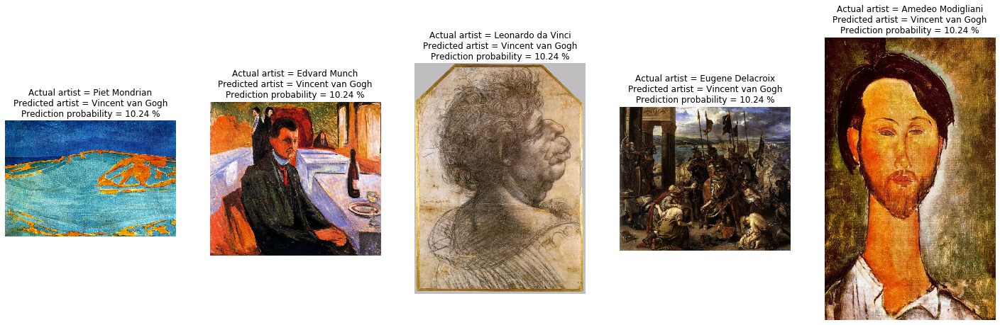

In [48]:
Prediction(twolayer_model)

## VGG - 16

In [49]:
def CNN_VGG_vgg_16(input_shape):
    vgg_16 = Sequential()

    vgg_16.add(Conv2D(input_shape = input_shape, filters = 32 , kernel_size = (3,3) ,padding='same', name= "conv_1"))
    vgg_16.add(Activation('relu'))
    vgg_16.add(Conv2D(filters = 64 ,  kernel_size = (3,3), padding='same', name= "conv_12"))
    vgg_16.add(Activation('relu'))
    vgg_16.add(MaxPooling2D((2,2) , name = "max_pool_1"))
    vgg_16.add(BatchNormalization(axis = 3 , name ="bn_1") )


    vgg_16.add(Conv2D(filters = 64 ,  kernel_size = (3,3), padding='same', name= "conv_21"))
    vgg_16.add(Activation('relu'))
    vgg_16.add(Conv2D(filters = 64 ,  kernel_size = (3,3), padding='same', name= "conv_22"))
    vgg_16.add(Activation('relu'))
    vgg_16.add(MaxPooling2D((2,2) ,name = "max_pool_2"))
    vgg_16.add(BatchNormalization(axis = 3 , name ="bn_2") )


    vgg_16.add(Conv2D(filters = 128 ,  kernel_size = (3,3), padding='same', name= "conv_3"))
    vgg_16.add(Activation('relu'))
    vgg_16.add(MaxPooling2D((2,2) , name = "max_pool_3"))
    vgg_16.add(BatchNormalization(axis = 3 , name ="bn_3") )
    
    


    vgg_16.add(Conv2D(filters = 256 ,  kernel_size = (3,3),padding='same', name= "conv_4"))
    vgg_16.add(Activation('relu'))
    vgg_16.add(MaxPooling2D((2,2) , name = "max_pool_4"))
    vgg_16.add(BatchNormalization(axis = 3 , name ="bn_4") )
    
    


    vgg_16.add(Conv2D(filters = 256 ,  kernel_size = (3,3), strides=(1,1), activation = 'relu' ,padding='same', name= "conv_5"))
    vgg_16.add(MaxPooling2D((2,2) , name = "max_pool_5"))
    vgg_16.add(BatchNormalization(axis = 3 , name ="bn_5") )
    
    

    vgg_16.add(Conv2D(filters = 512 ,  kernel_size = (3,3), strides=(1,1), activation = 'relu' ,padding='same', name= "conv_6"))
    vgg_16.add(MaxPooling2D((2,2) , name = "max_pool_6"))
    vgg_16.add(BatchNormalization(axis = 3 , name ="bn_6") )
    

    vgg_16.add(Flatten())

    vgg_16.add(Dense(512 , name = 'Fully_connected_11' ))
    vgg_16.add(Activation('relu'))
    # vgg_16.add(Dropout(rate = 0.2) )


    vgg_16.add(Dense(n_classes, activation= 'softmax', name = 'softmax_output_11' ))

    return vgg_16

In [50]:
dropout_rate = 0.2


cnn_vgg_vgg_16 = CNN_VGG_vgg_16(train_input_shape)

#adam = Adam(lr=0.01, beta_1=0.9, beta_2=0.99, amsgrad=False)
cnn_vgg_sgd = SGD(lr=0.003, momentum=0.9, nesterov=True)
#rms_prop = RMSprop(lr=0.001, rho =0.9)
cnn_vgg_vgg_16.compile(loss= 'categorical_crossentropy' ,
              optimizer = cnn_vgg_sgd,
               metrics=['accuracy'] )

cnn_vgg_vgg_16.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv_1 (Conv2D)              (None, 224, 224, 32)      896       
_________________________________________________________________
activation_1 (Activation)    (None, 224, 224, 32)      0         
_________________________________________________________________
conv_12 (Conv2D)             (None, 224, 224, 64)      18496     
_________________________________________________________________
activation_2 (Activation)    (None, 224, 224, 64)      0         
_________________________________________________________________
max_pool_1 (MaxPooling2D)    (None, 112, 112, 64)      0         
_________________________________________________________________
bn_1 (BatchNormalization)    (None, 112, 112, 64)      256       
_________________________________________________________________
conv_21 (Conv2D)             (None, 112, 112, 64)     

In [51]:
n_epoch = 50 #n_epoch :number of times training vect to update weight/ one complete iteration. 


early_stop = EarlyStopping(monitor='val_loss', patience=20, verbose=1, 
                           mode='auto', restore_best_weights=True)

reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=5, #I used ReduceLROnPlateau callback function when matri
                              verbose=1, mode='auto')
# Train the model - all layers
vgg16_history = cnn_vgg_vgg_16.fit_generator(generator=train_generator, steps_per_epoch=STEP_SIZE_TRAIN,
                              validation_data=valid_generator, validation_steps=STEP_SIZE_VALID,
                              epochs=n_epoch,
                              shuffle=True,
                              verbose=1                           
                             )

Epoch 1/50
178/423 [===========>..................] - ETA: 0s - loss: 3.9809 - accuracy: 0.12 - ETA: 9:32 - loss: 4.2076 - accuracy: 0.09 - ETA: 13:23 - loss: 4.1857 - accuracy: 0.062 - ETA: 14:50 - loss: 4.1772 - accuracy: 0.062 - ETA: 15:45 - loss: 4.2957 - accuracy: 0.062 - ETA: 16:10 - loss: 4.3093 - accuracy: 0.052 - ETA: 16:52 - loss: 4.3531 - accuracy: 0.062 - ETA: 17:11 - loss: 4.3542 - accuracy: 0.062 - ETA: 17:14 - loss: 4.3454 - accuracy: 0.062 - ETA: 17:15 - loss: 4.3473 - accuracy: 0.056 - ETA: 17:15 - loss: 4.3206 - accuracy: 0.051 - ETA: 17:15 - loss: 4.3330 - accuracy: 0.057 - ETA: 17:14 - loss: 4.3736 - accuracy: 0.057 - ETA: 17:13 - loss: 4.3688 - accuracy: 0.062 - ETA: 17:12 - loss: 4.4039 - accuracy: 0.058 - ETA: 17:10 - loss: 4.3771 - accuracy: 0.058 - ETA: 17:08 - loss: 4.3602 - accuracy: 0.062 - ETA: 17:07 - loss: 4.3021 - accuracy: 0.066 - ETA: 17:05 - loss: 4.2968 - accuracy: 0.069 - ETA: 17:04 - loss: 4.2948 - accuracy: 0.065 - ETA: 17:02 - loss: 4.2655 - accu

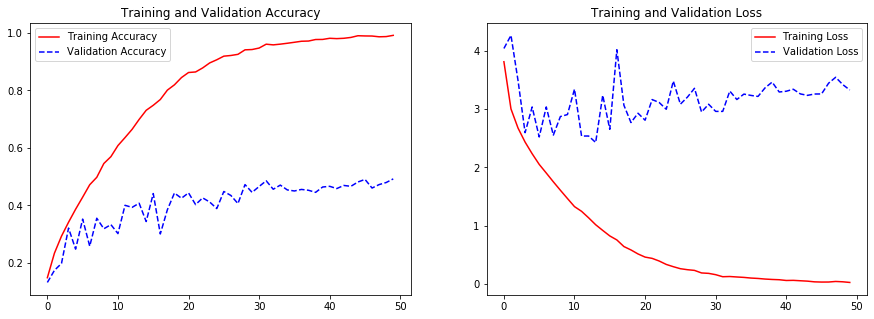

In [52]:
plot_training(vgg16_history)





In [53]:
vgg16_history.history['loss']

[3.8115694522857666,
 3.0032382011413574,
 2.6749134063720703,
 2.4347760677337646,
 2.2351529598236084,
 2.05226469039917,
 1.9044548273086548,
 1.7541331052780151,
 1.6093201637268066,
 1.467769980430603,
 1.3286622762680054,
 1.248243808746338,
 1.1368792057037354,
 1.0181177854537964,
 0.9206308126449585,
 0.8263619542121887,
 0.7575733065605164,
 0.6442298889160156,
 0.5860780477523804,
 0.5173158049583435,
 0.46361127495765686,
 0.44162625074386597,
 0.396129846572876,
 0.3378901183605194,
 0.2991170585155487,
 0.2645949423313141,
 0.24750776588916779,
 0.23559986054897308,
 0.19186341762542725,
 0.18473123013973236,
 0.16224004328250885,
 0.1271555870771408,
 0.13076171278953552,
 0.12276702374219894,
 0.1155691146850586,
 0.10430092364549637,
 0.09755851328372955,
 0.08718791604042053,
 0.08030133694410324,
 0.07560311257839203,
 0.06282005459070206,
 0.06496091932058334,
 0.058119162917137146,
 0.051421280950307846,
 0.03939635679125786,
 0.035697657614946365,
 0.0362173840403

In [54]:
vgg16_history.history

{'loss': [3.8115694522857666,
  3.0032382011413574,
  2.6749134063720703,
  2.4347760677337646,
  2.2351529598236084,
  2.05226469039917,
  1.9044548273086548,
  1.7541331052780151,
  1.6093201637268066,
  1.467769980430603,
  1.3286622762680054,
  1.248243808746338,
  1.1368792057037354,
  1.0181177854537964,
  0.9206308126449585,
  0.8263619542121887,
  0.7575733065605164,
  0.6442298889160156,
  0.5860780477523804,
  0.5173158049583435,
  0.46361127495765686,
  0.44162625074386597,
  0.396129846572876,
  0.3378901183605194,
  0.2991170585155487,
  0.2645949423313141,
  0.24750776588916779,
  0.23559986054897308,
  0.19186341762542725,
  0.18473123013973236,
  0.16224004328250885,
  0.1271555870771408,
  0.13076171278953552,
  0.12276702374219894,
  0.1155691146850586,
  0.10430092364549637,
  0.09755851328372955,
  0.08718791604042053,
  0.08030133694410324,
  0.07560311257839203,
  0.06282005459070206,
  0.06496091932058334,
  0.058119162917137146,
  0.051421280950307846,
  0.03939

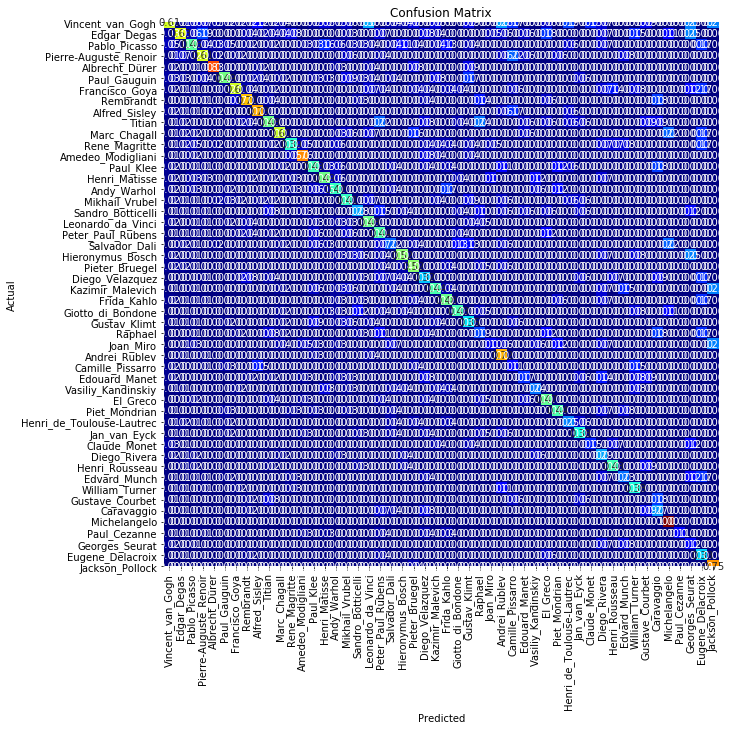

Classification Report:
                           precision    recall  f1-score   support

         Vincent_van_Gogh       0.53      0.61      0.56       173
              Edgar_Degas       0.57      0.63      0.60       137
            Pablo_Picasso       0.43      0.46      0.44        87
    Pierre-Auguste_Renoir       0.51      0.61      0.56        67
           Albrecht_Dürer       0.85      0.83      0.84        64
             Paul_Gauguin       0.65      0.49      0.56        63
           Francisco_Goya       0.73      0.60      0.66        58
                Rembrandt       0.62      0.71      0.66        51
            Alfred_Sisley       0.66      0.73      0.69        48
                   Titian       0.46      0.48      0.47        52
             Marc_Chagall       0.65      0.60      0.62        47
            Rene_Magritte       0.60      0.39      0.48        38
        Amedeo_Modigliani       0.74      0.76      0.75        38
                Paul_Klee       0.45  

In [55]:
showClassficationReport_Generator(cnn_vgg_vgg_16, valid_generator, STEP_SIZE_VALID)

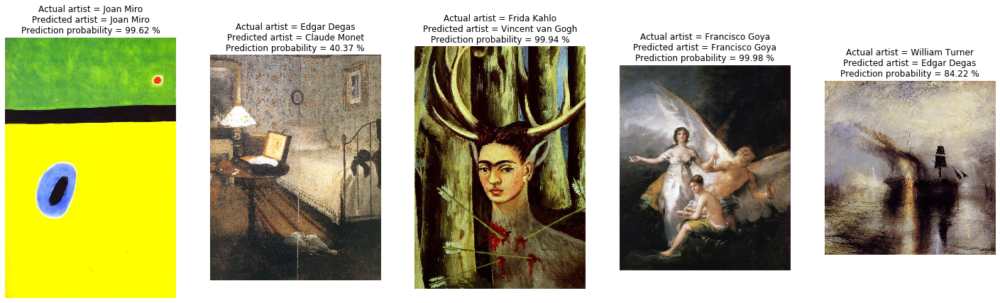

In [56]:
Prediction(cnn_vgg_vgg_16)

## Inceptions

In [57]:
from keras.applications.inception_v3 import InceptionV3
from keras.layers import Input

In [58]:
input_tensor = Input(shape=(224, 224, 3))  # this assumes K.image_data_format() == 'channels_last'

inception_model = InceptionV3(input_tensor=input_tensor, weights=None, include_top=True, classes = n_classes )
inception_model.summary()

Model: "inception_v3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 111, 111, 32) 864         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 111, 111, 32) 96          conv2d[0][0]                     
__________________________________________________________________________________________________
activation_8 (Activation)       (None, 111, 111, 32) 0           batch_normalization[0][0]        
_______________________________________________________________________________________

In [59]:
inception_adam = Adam(lr=0.001, beta_1=0.9, beta_2=0.99, amsgrad=False)
inception_sgd = SGD(lr=0.003, momentum=0.9, nesterov=True)

inception_model.compile(loss= 'categorical_crossentropy' ,
              optimizer = inception_sgd,
               metrics=['accuracy'] )

In [60]:
n_epoch = 50 #n_epoch :number of times training vect to update weight/ one complete iteration. 


early_stop = EarlyStopping(monitor='val_loss', patience=20, verbose=1, 
                           mode='auto', restore_best_weights=True)

reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=5, #I used ReduceLROnPlateau callback function when matri
                              verbose=1, mode='auto')
# Train the model - all layers
inception_history = inception_model.fit_generator(generator=train_generator, steps_per_epoch=STEP_SIZE_TRAIN,
                              validation_data=valid_generator, validation_steps=STEP_SIZE_VALID,
                              epochs=n_epoch,
                              shuffle=True,
                              verbose=1                           
                             )

Epoch 1/50
177/423 [===========>..................] - ETA: 0s - loss: 4.0781 - accuracy: 0.0000e+ - ETA: 12:38 - loss: 4.1645 - accuracy: 0.0000e+0 - ETA: 16:37 - loss: 4.1716 - accuracy: 0.0000e+0 - ETA: 18:37 - loss: 4.1539 - accuracy: 0.0000e+0 - ETA: 19:45 - loss: 4.1222 - accuracy: 0.0000e+0 - ETA: 20:30 - loss: 4.1168 - accuracy: 0.0000e+0 - ETA: 21:01 - loss: 4.0524 - accuracy: 0.0179    - ETA: 21:23 - loss: 3.9805 - accuracy: 0.031 - ETA: 21:40 - loss: 3.9993 - accuracy: 0.034 - ETA: 21:51 - loss: 3.9341 - accuracy: 0.037 - ETA: 22:05 - loss: 3.9268 - accuracy: 0.039 - ETA: 22:12 - loss: 3.9203 - accuracy: 0.036 - ETA: 22:18 - loss: 3.9170 - accuracy: 0.043 - ETA: 22:22 - loss: 3.9021 - accuracy: 0.053 - ETA: 22:25 - loss: 3.8859 - accuracy: 0.062 - ETA: 22:28 - loss: 3.8652 - accuracy: 0.066 - ETA: 22:30 - loss: 3.8615 - accuracy: 0.069 - ETA: 22:31 - loss: 3.8586 - accuracy: 0.076 - ETA: 22:32 - loss: 3.8449 - accuracy: 0.082 - ETA: 22:33 - loss: 3.8461 - accuracy: 0.087 - ET

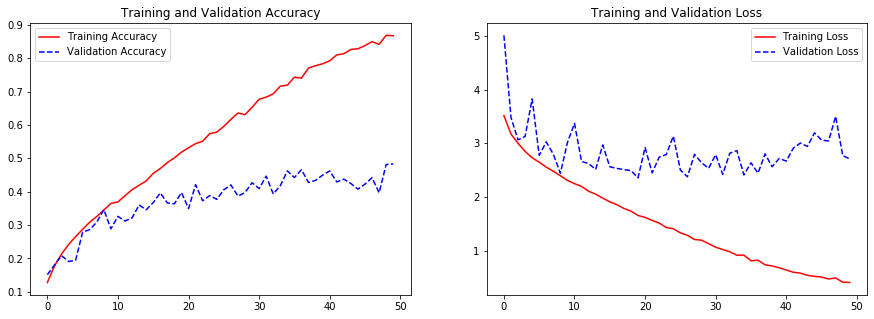

In [61]:
plot_training(inception_history)

In [62]:
inception_history.history['loss']

[3.5152316093444824,
 3.172192335128784,
 2.9994654655456543,
 2.8496437072753906,
 2.729893684387207,
 2.648106813430786,
 2.5554392337799072,
 2.4796769618988037,
 2.395718812942505,
 2.309211492538452,
 2.2491705417633057,
 2.1974315643310547,
 2.1073060035705566,
 2.0530033111572266,
 1.9788981676101685,
 1.9104925394058228,
 1.8580108880996704,
 1.7868350744247437,
 1.7383251190185547,
 1.6564345359802246,
 1.6202571392059326,
 1.5633249282836914,
 1.5155664682388306,
 1.4328750371932983,
 1.40878427028656,
 1.3326878547668457,
 1.2876056432724,
 1.2083759307861328,
 1.1971759796142578,
 1.1308860778808594,
 1.0655620098114014,
 1.0219690799713135,
 0.9804948568344116,
 0.9171308875083923,
 0.9166660904884338,
 0.8140690922737122,
 0.8232966065406799,
 0.7377126812934875,
 0.7171253561973572,
 0.6825539469718933,
 0.6407783627510071,
 0.5992599129676819,
 0.5834922194480896,
 0.5420392155647278,
 0.5236012935638428,
 0.5097532868385315,
 0.4735915958881378,
 0.49266621470451355,
 

In [63]:
inception_history.history

{'loss': [3.5152316093444824,
  3.172192335128784,
  2.9994654655456543,
  2.8496437072753906,
  2.729893684387207,
  2.648106813430786,
  2.5554392337799072,
  2.4796769618988037,
  2.395718812942505,
  2.309211492538452,
  2.2491705417633057,
  2.1974315643310547,
  2.1073060035705566,
  2.0530033111572266,
  1.9788981676101685,
  1.9104925394058228,
  1.8580108880996704,
  1.7868350744247437,
  1.7383251190185547,
  1.6564345359802246,
  1.6202571392059326,
  1.5633249282836914,
  1.5155664682388306,
  1.4328750371932983,
  1.40878427028656,
  1.3326878547668457,
  1.2876056432724,
  1.2083759307861328,
  1.1971759796142578,
  1.1308860778808594,
  1.0655620098114014,
  1.0219690799713135,
  0.9804948568344116,
  0.9171308875083923,
  0.9166660904884338,
  0.8140690922737122,
  0.8232966065406799,
  0.7377126812934875,
  0.7171253561973572,
  0.6825539469718933,
  0.6407783627510071,
  0.5992599129676819,
  0.5834922194480896,
  0.5420392155647278,
  0.5236012935638428,
  0.50975328

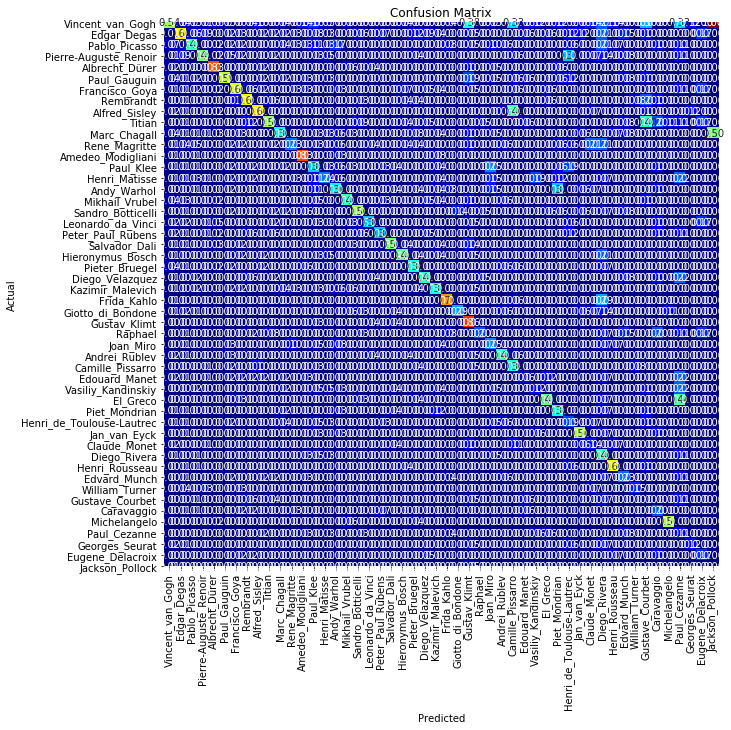

Classification Report:
                           precision    recall  f1-score   support

         Vincent_van_Gogh       0.51      0.54      0.53       171
              Edgar_Degas       0.55      0.66      0.60       140
            Pablo_Picasso       0.51      0.42      0.46        86
    Pierre-Auguste_Renoir       0.68      0.49      0.57        69
           Albrecht_Dürer       0.74      0.83      0.78        64
             Paul_Gauguin       0.63      0.59      0.61        63
           Francisco_Goya       0.61      0.61      0.61        59
                Rembrandt       0.56      0.65      0.60        51
            Alfred_Sisley       0.64      0.65      0.65        52
                   Titian       0.60      0.54      0.57        52
             Marc_Chagall       0.52      0.37      0.43        46
            Rene_Magritte       0.47      0.23      0.31        39
        Amedeo_Modigliani       0.65      0.83      0.73        36
                Paul_Klee       0.23  

In [64]:
showClassficationReport_Generator(inception_model, valid_generator, STEP_SIZE_VALID)

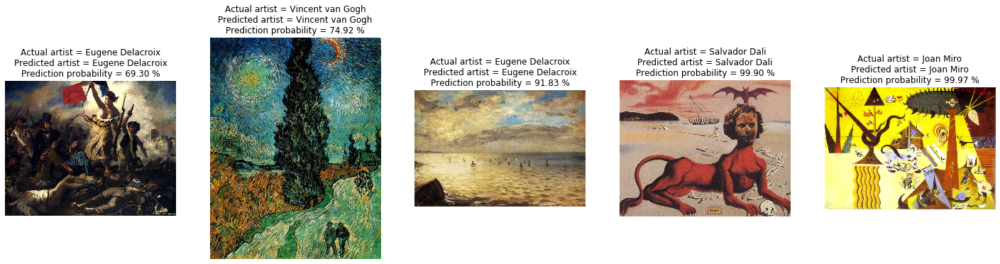

In [65]:
Prediction(inception_model)

## Resnet 50

In [44]:
#https://www.quora.com/ResNet50-tutorial
# Load pre-trained model
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=train_input_shape)
# I am using ResNet50 neural network it performs well for image data.
for layer in base_model.layers:
    layer.trainable = True

In [45]:
#https://github.com/keras-team/keras-applications/blob/master/keras_applications/
# Add layers at the end
# creating layers for neural network
X = base_model.output
X = Flatten()(X)

X = Dense(512, kernel_initializer='he_uniform')(X) # he_uniform is a weight to neural network
#X = Dropout(0.5)(X)
X = BatchNormalization()(X)
X = Activation('relu')(X)  # activation function i am using is "relu".  

X = Dense(16, kernel_initializer='he_uniform')(X)
#X = Dropout(0.5)(X)
X = BatchNormalization()(X)
X = Activation('relu')(X)

output = Dense(n_classes, activation='softmax')(X)

model = Model(inputs=base_model.input, outputs=output)

In [46]:
#For training neural network i am using Adam optimiser.
#SGD will be slow not perform well so Adam performs better.
optimizer = Adam(lr=0.0001) 
model.compile(loss='categorical_crossentropy',
              optimizer=optimizer, 
              metrics=['accuracy'])

In [69]:
n_epoch = 50 #n_epoch :number of times training vect to update weight/ one complete iteration. 


early_stop = EarlyStopping(monitor='val_loss', patience=20, verbose=1, 
                           mode='auto', restore_best_weights=True)

reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=5, #I used ReduceLROnPlateau callback function when matri
                              verbose=1, mode='auto')
# Train the model - all layers
history1 = model.fit_generator(generator=train_generator, steps_per_epoch=STEP_SIZE_TRAIN,
                              validation_data=valid_generator, validation_steps=STEP_SIZE_VALID,
                              epochs=n_epoch,
                              shuffle=True,
                              verbose=1                           
                             )

Epoch 1/50
177/423 [===========>..................] - ETA: 0s - loss: 4.0721 - accuracy: 0.0000e+ - ETA: 25:01 - loss: 4.0974 - accuracy: 0.0000e+0 - ETA: 33:59 - loss: 4.0967 - accuracy: 0.0000e+0 - ETA: 38:46 - loss: 4.0118 - accuracy: 0.0000e+0 - ETA: 41:05 - loss: 4.0020 - accuracy: 0.0000e+0 - ETA: 42:27 - loss: 3.9811 - accuracy: 0.0000e+0 - ETA: 43:16 - loss: 3.9872 - accuracy: 0.0000e+0 - ETA: 43:55 - loss: 3.9818 - accuracy: 0.0078    - ETA: 44:20 - loss: 3.9597 - accuracy: 0.027 - ETA: 44:41 - loss: 3.9488 - accuracy: 0.031 - ETA: 44:57 - loss: 3.9556 - accuracy: 0.028 - ETA: 45:08 - loss: 3.9611 - accuracy: 0.026 - ETA: 45:15 - loss: 3.9625 - accuracy: 0.024 - ETA: 45:20 - loss: 3.9593 - accuracy: 0.022 - ETA: 45:27 - loss: 3.9434 - accuracy: 0.029 - ETA: 45:28 - loss: 3.9358 - accuracy: 0.027 - ETA: 45:31 - loss: 3.9234 - accuracy: 0.025 - ETA: 45:31 - loss: 3.9311 - accuracy: 0.024 - ETA: 45:32 - loss: 3.9191 - accuracy: 0.026 - ETA: 45:49 - loss: 3.9129 - accuracy: 0.028 

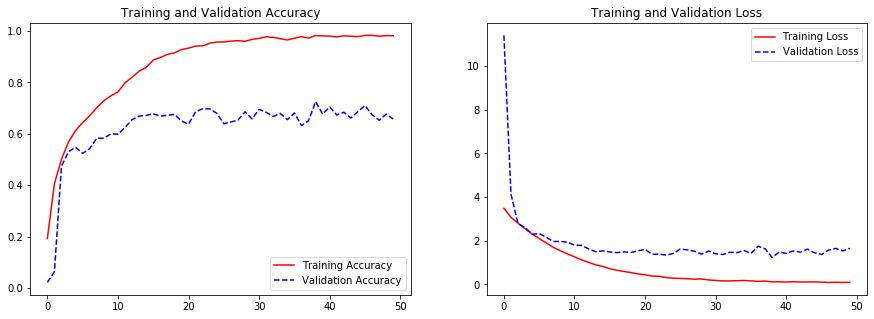

In [70]:
plot_training(history1)

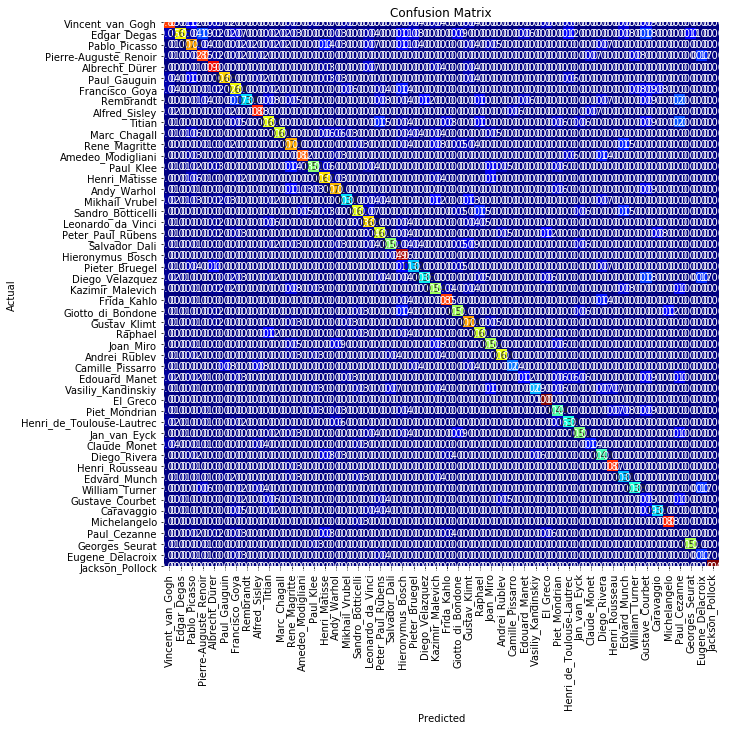

Classification Report:
                           precision    recall  f1-score   support

         Vincent_van_Gogh       0.67      0.85      0.75       170
              Edgar_Degas       0.85      0.65      0.73       141
            Pablo_Picasso       0.49      0.74      0.59        89
    Pierre-Auguste_Renoir       0.63      0.85      0.73        67
           Albrecht_Dürer       0.72      0.90      0.80        61
             Paul_Gauguin       0.74      0.68      0.71        63
           Francisco_Goya       0.51      0.64      0.57        59
                Rembrandt       0.94      0.34      0.50        50
            Alfred_Sisley       0.81      0.88      0.84        49
                   Titian       0.56      0.63      0.60        49
             Marc_Chagall       0.93      0.61      0.74        46
            Rene_Magritte       0.52      0.73      0.61        37
        Amedeo_Modigliani       0.89      0.82      0.85        38
                Paul_Klee       0.74  

In [71]:
showClassficationReport_Generator(model, valid_generator, STEP_SIZE_VALID)

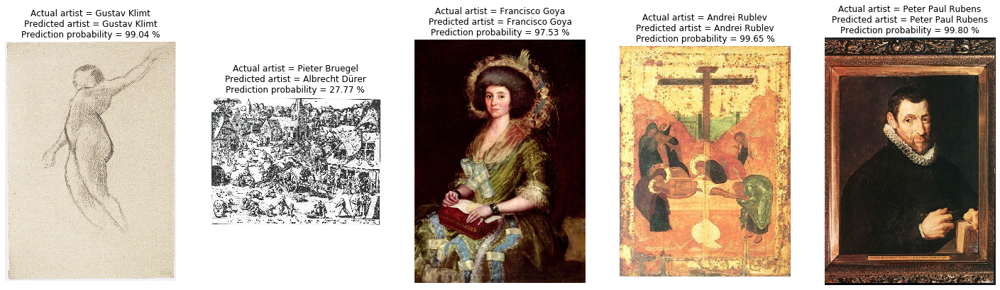

In [72]:
Prediction(model)


## ReTrain ResNet50 by freexeing few layers

In [45]:
#https://www.quora.com/ResNet50-tutorial
# Load pre-trained model
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=train_input_shape)
# I am using ResNet50 neural network it performs well for image data.
for layer in base_model.layers:
    layer.trainable = True
    
#https://github.com/keras-team/keras-applications/blob/master/keras_applications/
# Add layers at the end
# creating layers for neural network
X = base_model.output
X = Flatten()(X)

X = Dense(512, kernel_initializer='he_uniform')(X) # he_uniform is a weight to neural network
#X = Dropout(0.5)(X)
X = BatchNormalization()(X)
X = Activation('relu')(X)  # activation function i am using is "relu".  

X = Dense(16, kernel_initializer='he_uniform')(X)
#X = Dropout(0.5)(X)
X = BatchNormalization()(X)
X = Activation('relu')(X)

output = Dense(n_classes, activation='softmax')(X)

model = Model(inputs=base_model.input, outputs=output)

#For training neural network i am using Adam optimiser.
#SGD will be slow not perform well so Adam performs better.
optimizer = Adam(lr=0.0001) 
model.compile(loss='categorical_crossentropy',
              optimizer=optimizer, 
              metrics=['accuracy'])
n_epoch = 25 #n_epoch :number of times training vect to update weight/ one complete iteration. 


early_stop = EarlyStopping(monitor='val_loss', patience=20, verbose=1, 
                           mode='auto', restore_best_weights=True)

reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=5, #I used ReduceLROnPlateau callback function when matri
                              verbose=1, mode='auto')
# Train the model - all layers
history1 = model.fit_generator(generator=train_generator, steps_per_epoch=STEP_SIZE_TRAIN,
                              validation_data=valid_generator, validation_steps=STEP_SIZE_VALID,
                              epochs=n_epoch,
                              shuffle=True,
                              verbose=1                           
                             )

Instructions for updating:
Please use Model.fit, which supports generators.
Epoch 1/25
177/423 [===========>..................] - ETA: 0s - loss: 3.9483 - accuracy: 0.0000e+ - ETA: 24:44 - loss: 3.9703 - accuracy: 0.0000e+0 - ETA: 32:39 - loss: 3.9906 - accuracy: 0.0000e+0 - ETA: 36:55 - loss: 4.0022 - accuracy: 0.0000e+0 - ETA: 39:35 - loss: 4.0066 - accuracy: 0.0000e+0 - ETA: 41:16 - loss: 3.9718 - accuracy: 0.0000e+0 - ETA: 42:17 - loss: 3.9840 - accuracy: 0.0000e+0 - ETA: 43:00 - loss: 3.9585 - accuracy: 0.0156    - ETA: 43:35 - loss: 3.9269 - accuracy: 0.013 - ETA: 44:01 - loss: 3.8995 - accuracy: 0.025 - ETA: 44:18 - loss: 3.8947 - accuracy: 0.022 - ETA: 44:32 - loss: 3.8854 - accuracy: 0.036 - ETA: 44:51 - loss: 3.8830 - accuracy: 0.033 - ETA: 45:03 - loss: 3.8553 - accuracy: 0.035 - ETA: 45:08 - loss: 3.8479 - accuracy: 0.033 - ETA: 45:11 - loss: 3.8389 - accuracy: 0.035 - ETA: 45:14 - loss: 3.8337 - accuracy: 0.036 - ETA: 45:20 - loss: 3.8283 - accuracy: 0.038 - ETA: 45:20 - l

In [46]:
for layer in model.layers:
    layer.trainable = False

for layer in model.layers[:50]:
    layer.trainable = True

optimizer = Adam(lr=0.0001)

model.compile(loss='categorical_crossentropy',
              optimizer=optimizer, 
              metrics=['accuracy'])

n_epoch = 25
history2 = model.fit_generator(generator=train_generator, steps_per_epoch=STEP_SIZE_TRAIN,
                              validation_data=valid_generator, validation_steps=STEP_SIZE_VALID,
                              epochs=n_epoch,
                              shuffle=True,
                              verbose=1)
                             

Epoch 1/25
178/423 [===========>..................] - ETA: 0s - loss: 0.2657 - accuracy: 0.93 - ETA: 18:02 - loss: 0.1650 - accuracy: 0.968 - ETA: 24:23 - loss: 0.1441 - accuracy: 0.979 - ETA: 27:08 - loss: 0.1428 - accuracy: 0.984 - ETA: 28:44 - loss: 0.1282 - accuracy: 0.987 - ETA: 29:50 - loss: 0.1220 - accuracy: 0.989 - ETA: 30:33 - loss: 0.1157 - accuracy: 0.991 - ETA: 31:00 - loss: 0.1452 - accuracy: 0.984 - ETA: 31:23 - loss: 0.1442 - accuracy: 0.986 - ETA: 31:40 - loss: 0.1615 - accuracy: 0.975 - ETA: 31:53 - loss: 0.1611 - accuracy: 0.977 - ETA: 32:02 - loss: 0.1539 - accuracy: 0.979 - ETA: 32:08 - loss: 0.1490 - accuracy: 0.980 - ETA: 32:16 - loss: 0.1435 - accuracy: 0.982 - ETA: 32:22 - loss: 0.1410 - accuracy: 0.983 - ETA: 32:24 - loss: 0.1377 - accuracy: 0.984 - ETA: 32:28 - loss: 0.1347 - accuracy: 0.985 - ETA: 32:29 - loss: 0.1374 - accuracy: 0.986 - ETA: 32:29 - loss: 0.1391 - accuracy: 0.986 - ETA: 32:29 - loss: 0.1362 - accuracy: 0.987 - ETA: 32:29 - loss: 0.1355 - ac

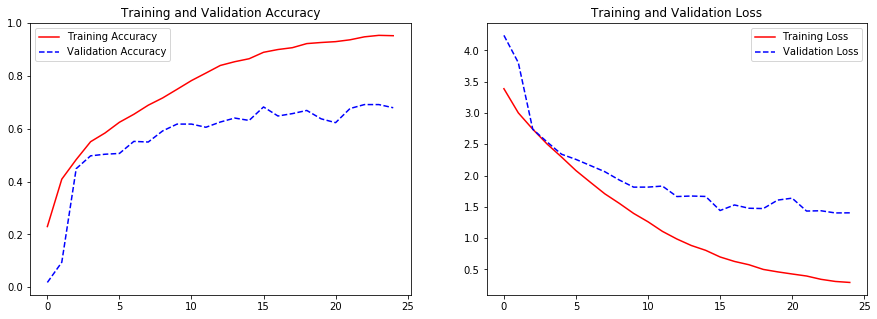

In [47]:
plot_training(history1)

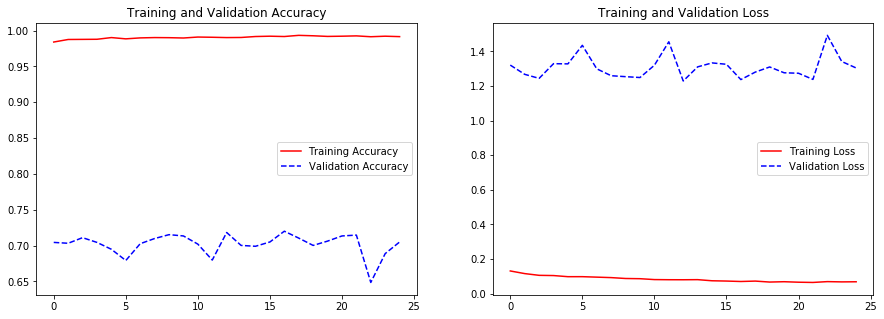

In [48]:
plot_training(history2)

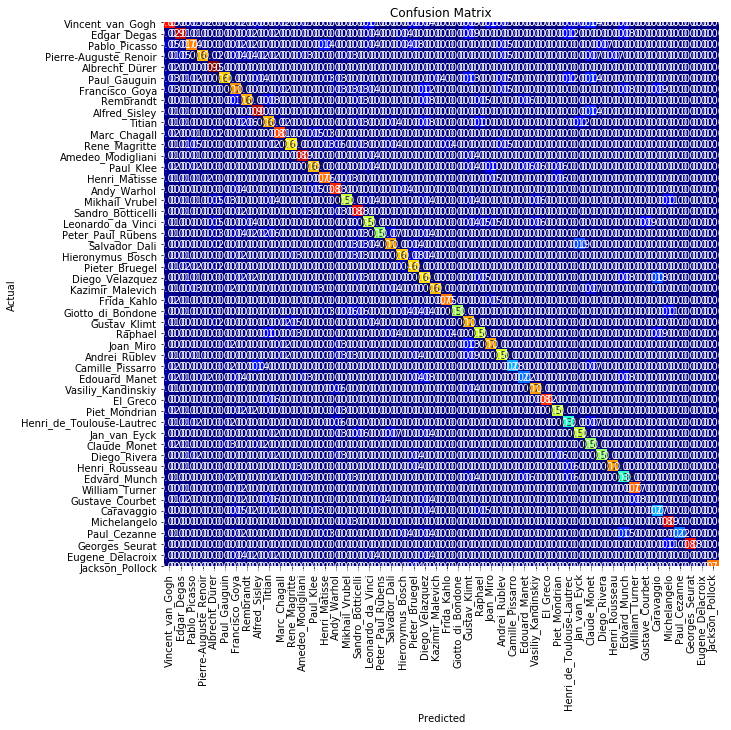

Classification Report:
                           precision    recall  f1-score   support

         Vincent_van_Gogh       0.67      0.85      0.75       175
              Edgar_Degas       0.75      0.91      0.82       140
            Pablo_Picasso       0.70      0.74      0.72        87
    Pierre-Auguste_Renoir       0.94      0.68      0.79        66
           Albrecht_Dürer       0.83      0.95      0.89        65
             Paul_Gauguin       0.82      0.66      0.73        62
           Francisco_Goya       0.59      0.72      0.65        57
                Rembrandt       0.72      0.69      0.71        52
            Alfred_Sisley       0.75      0.90      0.82        51
                   Titian       0.56      0.69      0.61        51
             Marc_Chagall       0.86      0.81      0.84        47
            Rene_Magritte       0.80      0.63      0.71        38
        Amedeo_Modigliani       0.87      0.89      0.88        38
                Paul_Klee       0.81  

In [49]:
showClassficationReport_Generator(model, valid_generator, STEP_SIZE_VALID)

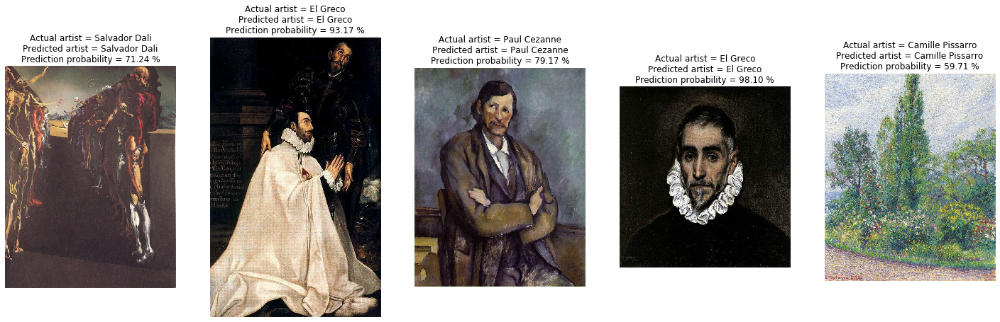

In [50]:
Prediction(model)